In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, roc_auc_score, roc_curve, auc, accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression # For Stacking meta-learner (LR)
import pandas as pd
import seaborn as sns
import gc # Garbage Collection for memory management
import zipfile # For improved unzipping
import random # For picking random misclassified images

print("Starting script...")

Starting script...


In [ ]:

# Block 1: GPU Availability Check
print("Checking for GPU availability...")
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
        print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)
else:
    print("No GPU found. Running on CPU. This might be slow for large models and datasets.")

Checking for GPU availability...
1 Physical GPUs, 1 Logical GPUs
Default GPU Device: /device:GPU:0


In [ ]:
# Block 2: Google Drive Authentication and Dataset Unzipping
print("\nMounting Google Drive...")
from google.colab import drive
drive.mount('/content/gdrive')
print("Google Drive mounted.")

# --- Define Base Output Directory in Google Drive ---
# !!! IMPORTANT: CHANGE THIS PATH to your desired base directory in Google Drive !!!
# Changed to a new distinct folder name as requested for a fresh run
BASE_OUTPUT_DIR = '/content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/'
os.makedirs(BASE_OUTPUT_DIR, exist_ok=True)
print(f"All results will be saved to: {BASE_OUTPUT_DIR}")

zip_file_path = os.path.join(BASE_OUTPUT_DIR, 'BanglaDressNet_Dataset.zip') # Assuming you place zip in output dir
unzip_destination = '/content/'
dataset_final_path = os.path.join(unzip_destination, 'BanglaDressNet_Dataset')

# Check and unzip
if not os.path.exists(zip_file_path):
    print(f"Error: Zip file not found at {zip_file_path}. Please upload it to {BASE_OUTPUT_DIR} and try again.")
else:
    print(f"Unzipping {zip_file_path} to {unzip_destination}...")
    try:
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            zip_ref.extractall(unzip_destination)
        if os.path.exists(dataset_final_path):
            print(f"Dataset unzipped successfully to {dataset_final_path}.")
        else:
            print(f"Error: Dataset directory not found at {dataset_final_path} after unzipping.")
    except zipfile.BadZipFile:
        print(f"Error: {zip_file_path} is not a valid zip file or is corrupted.")
    except Exception as e:
        print(f"An unexpected error occurred during unzipping: {e}")

print(f"\nTensorFlow Version: {tf.__version__}")


Mounting Google Drive...
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Google Drive mounted.
All results will be saved to: /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/
Unzipping /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/BanglaDressNet_Dataset.zip to /content/...
Dataset unzipped successfully to /content/BanglaDressNet_Dataset.

TensorFlow Version: 2.18.0


In [ ]:
# Block 3: Define Dataset Directories and Image Parameters
train_dir = os.path.join(dataset_final_path, 'train')
validation_dir = os.path.join(dataset_final_path, 'val')
test_dir = os.path.join(dataset_final_path, 'test')

BATCH_SIZE = 32
IMG_SIZE = (224, 224)

In [ ]:



# Block 4: Load Datasets using image_dataset_from_directory
print(f"\nLoading datasets from: {dataset_final_path}")
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    shuffle=True,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    interpolation='bilinear'
)
validation_dataset = tf.keras.utils.image_dataset_from_directory(
    validation_dir,
    shuffle=True,
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    interpolation='bilinear'
)
test_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    shuffle=False, # Keep order for evaluation
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    interpolation='bilinear'
)

class_names = train_dataset.class_names
nb_classes = len(class_names)
print(f"Detected {nb_classes} classes: {class_names}")

AUTOTUNE = tf.data.AUTOTUNE
train_dataset = train_dataset.cache().prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.cache().prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.cache().prefetch(buffer_size=AUTOTUNE)



Loading datasets from: /content/BanglaDressNet_Dataset
Found 5600 files belonging to 16 classes.
Found 1200 files belonging to 16 classes.
Found 1200 files belonging to 16 classes.
Detected 16 classes: ['Blouse', 'Dhoti', 'Dupatta', 'Fatua', 'Frock', 'Gamcha', 'Koti', 'Lungi', 'Maxi', 'Muffler', 'Panjabi', 'Petticoat', 'Salwaar_Kameez', 'Sando_Genji', 'Saree', 'Shawl']


In [ ]:
# Block 5: Data Augmentation Layer (Applied inside model construction now)
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal", name="random_flip"),
    layers.RandomRotation(0.1, name="random_rotation"),
    layers.RandomZoom(0.1, name="random_zoom"),
    layers.RandomContrast(0.2, name="random_contrast"),
    layers.RandomBrightness(0.2, name="random_brightness"),
], name="data_augmentation_layer")



Visualizing augmented images (optional)...


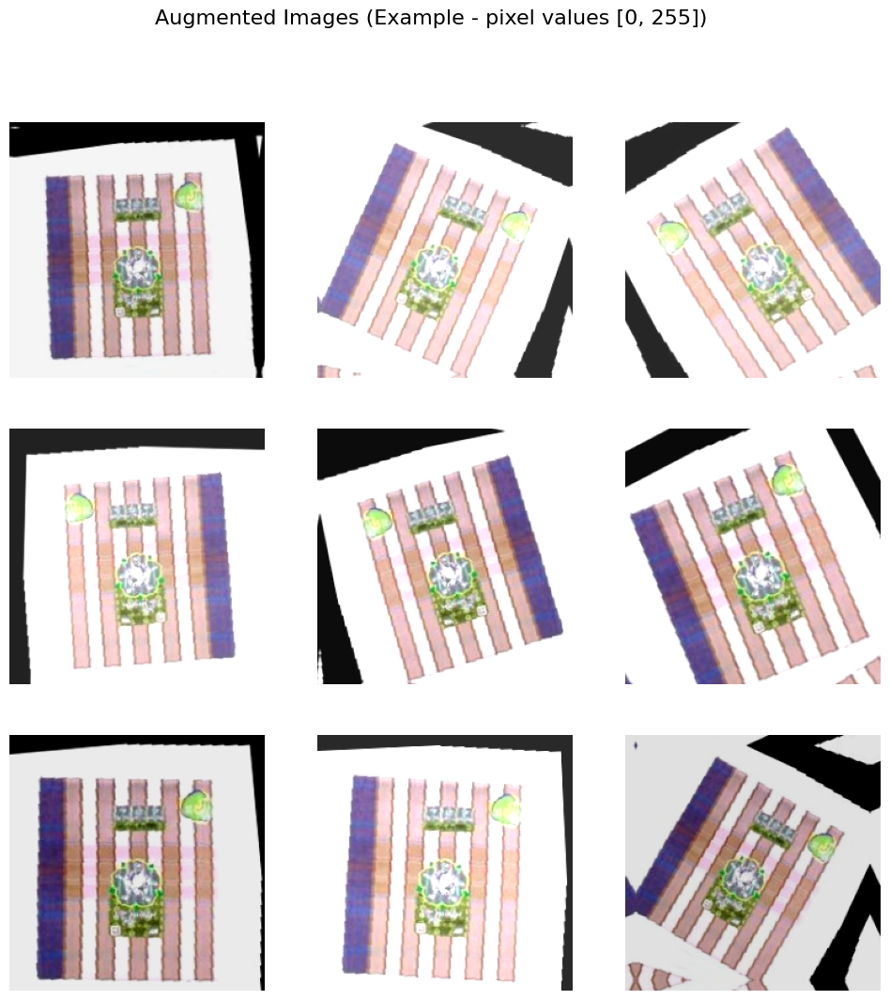

In [ ]:
# Block 6: Visualize Augmented Images (Optional - for verification)
print("\nVisualizing augmented images (optional)...")
plt.figure(figsize=(12, 12))
for images, labels in train_dataset.take(1):
    first_image = images[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0), training=True)
        plt.imshow(augmented_image[0].numpy().astype("uint8"))
        plt.axis("off")
plt.suptitle("Augmented Images (Example - pixel values [0, 255])", fontsize=16)
plt.show()
plt.close() # Close the plot to free memory

# --- Function to create a model for training and feature extraction ---
def create_model_for_training(model_name, input_shape, num_classes):
    """
    Builds a Keras model with a pre-trained base and a custom head,
    ready for training. Includes data augmentation and model-specific preprocessing.
    Also returns a feature extractor model.
    """
    base_model_application = None
    preprocess_func = None

    # Removed ConvNeXtTiny related logic
    # def convnext_preprocess(x):
    #     return x # ConvNeXtTiny in tf.keras.applications expects [0, 255] inputs

    if model_name == 'EfficientNetB1':
        from tensorflow.keras.applications import EfficientNetB1 as KerasEfficientNetB1
        base_model_application = KerasEfficientNetB1
        from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess_input
        preprocess_func = efficientnet_preprocess_input
    elif model_name == 'DenseNet121':
        from tensorflow.keras.applications import DenseNet121 as KerasDenseNet121
        base_model_application = KerasDenseNet121
        from tensorflow.keras.applications.densenet import preprocess_input as densenet_preprocess_input
        preprocess_func = densenet_preprocess_input
    elif model_name == 'Xception':
        from tensorflow.keras.applications import Xception as KerasXception
        base_model_application = KerasXception
        from tensorflow.keras.applications.xception import preprocess_input as xception_preprocess_input
        preprocess_func = xception_preprocess_input
    else:
        raise ValueError(f"Model {model_name} not supported for training in this function. Available: EfficientNetB1, DenseNet121, Xception.")

    inputs = keras.Input(shape=input_shape, name=f"input_image_{model_name}")
    x = data_augmentation(inputs) # Apply data augmentation
    x_processed = preprocess_func(x)        # Apply model-specific preprocessing

    base_model = base_model_application(
        weights="imagenet",
        input_shape=input_shape,
        include_top=False,
    )
    base_model.trainable = False # Start with freezing base model

    # Get features from the base model
    features = base_model(x_processed, training=False) # Ensure batch norm runs in inference mode

    # Define the classification head
    x_head = GlobalAveragePooling2D(name=f"global_average_pooling_{model_name}")(features)
    x_head = Dropout(0.3, name=f"dropout_{model_name}")(x_head)
    x_head = Dense(512, activation="relu", name=f"dense_512_{model_name}")(x_head)
    outputs = Dense(num_classes, activation="softmax", name=f"output_{model_name}")(x_head)

    model = keras.Model(inputs=inputs, outputs=outputs, name=f"{model_name}_transfer_learning_model")

    # Create a separate model for extracting features (from the base model's output)
    # This model takes original image input -> augmentation -> preprocess -> base_model features
    feature_extractor_model = keras.Model(inputs=inputs, outputs=features, name=f"{model_name}_feature_extractor")

    return model, base_model, feature_extractor_model # Return all three components

In [ ]:
# --- Function to create MLP Meta-learner ---
def create_mlp_meta_learner(input_dim, num_classes, name="MLP_Meta_Learner"):
    model = keras.Sequential([
        keras.Input(shape=(input_dim,)),
        layers.Dense(256, activation='relu', name=f'{name}_dense_1'),
        layers.Dropout(0.3, name=f'{name}_dropout_1'),
        layers.Dense(128, activation='relu', name=f'{name}_dense_2'),
        layers.Dropout(0.3, name=f'{name}_dropout_2'),
        layers.Dense(num_classes, activation='softmax', name=f'{name}_output')
    ], name=name)
    return model

In [ ]:
# --- Function to evaluate and save results (for individual models) ---
def evaluate_and_save_results(model_instance, dataset_to_evaluate, true_labels, class_names, model_dir, prefix=""):
    print(f"\n==== Evaluating {prefix.replace('_', ' ').strip()} Model ====")
    scores = model_instance.evaluate(dataset_to_evaluate, verbose=0)
    print(f"Overall Test Accuracy: {scores[1]*100:.2f}%")

    pred_probs = model_instance.predict(dataset_to_evaluate, verbose=0)
    pred_labels = np.argmax(pred_probs, axis=1)

    overall_score_df = pd.DataFrame({
        'Metric': ['Test Accuracy', 'Test Loss'],
        'Score': [scores[1], scores[0]]
    })
    overall_score_filename = os.path.join(model_dir, f"{prefix}overall_scores.csv")
    overall_score_df.to_csv(overall_score_filename, index=False)
    print(f"{prefix}Overall scores saved to {overall_score_filename}")

    report = classification_report(true_labels, pred_labels, target_names=class_names, output_dict=True)
    report_df = pd.DataFrame(report).transpose()
    classification_report_filename = os.path.join(model_dir, f"{prefix}classification_report.csv")
    report_df.to_csv(classification_report_filename)
    print(f"{prefix}Classification report saved to {classification_report_filename}")

    precision_per_class = report_df['precision'].drop(['accuracy', 'macro avg', 'weighted avg']).values
    recall_per_class = report_df['recall'].drop(['accuracy', 'macro avg', 'weighted avg']).values
    f1_per_class = report_df['f1-score'].drop(['accuracy', 'macro avg', 'weighted avg']).values
    metrics_df = pd.DataFrame({
        'Class': class_names,
        'Precision': precision_per_class,
        'Recall': recall_per_class,
        'F1 Score': f1_per_class
    })
    classwise_metrics_filename = os.path.join(model_dir, f"{prefix}classwise_metrics.csv")
    metrics_df.to_csv(classwise_metrics_filename, index=False)
    print(f"{prefix}Class-wise metrics saved to {classwise_metrics_filename}")

    cm = confusion_matrix(true_labels, pred_labels)
    plt.figure(figsize=(12, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix for {prefix.replace('_', ' ').strip()}")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    cm_filename = os.path.join(model_dir, f"{prefix}confusion_matrix.png")
    plt.savefig(cm_filename)
    plt.show()
    plt.close()
    print(f"Confusion matrix plot saved to {cm_filename}")

    plt.figure(figsize=(10, 8))
    for i in range(len(class_names)):
        fpr, tpr, _ = roc_curve(true_labels == i, pred_probs[:, i])
        plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"ROC Curve by Class for {prefix.replace('_', ' ').strip()}")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    roc_filename = os.path.join(model_dir, f"{prefix}roc_curve.png")
    plt.savefig(roc_filename)
    plt.show()
    plt.close()
    print(f"ROC curve plot saved to {roc_filename}")
    return scores[1], pred_probs

In [ ]:
# --- Function to evaluate and save ENSEMBLE results ---
def evaluate_ensemble(ensemble_name, ensemble_pred_probs, true_labels, class_names, ensemble_dir):
    print(f"\n==== Evaluating Ensemble: {ensemble_name.replace('_', ' ').strip()} ====")

    ensemble_pred_labels = np.argmax(ensemble_pred_probs, axis=1)
    accuracy = accuracy_score(true_labels, ensemble_pred_labels)
    print(f"Overall Test Accuracy ({ensemble_name.replace('_', ' ').strip()}): {accuracy*100:.2f}%")

    overall_score_df = pd.DataFrame({
        'Metric': ['Test Accuracy'],
        'Score': [accuracy]
    })
    overall_score_filename = os.path.join(ensemble_dir, f"{ensemble_name}_overall_scores.csv")
    overall_score_df.to_csv(overall_score_filename, index=False)
    print(f"{ensemble_name} Overall scores saved to {overall_score_filename}")

    report = classification_report(true_labels, ensemble_pred_labels, target_names=class_names, output_dict=True)
    report_df = pd.DataFrame(report).transpose()
    classification_report_filename = os.path.join(ensemble_dir, f"{ensemble_name}_classification_report.csv")
    report_df.to_csv(classification_report_filename)
    print(f"{ensemble_name} Classification report saved to {classification_report_filename}")

    precision_per_class = report_df['precision'].drop(['accuracy', 'macro avg', 'weighted avg']).values
    recall_per_class = report_df['recall'].drop(['accuracy', 'macro avg', 'weighted avg']).values
    f1_per_class = report_df['f1-score'].drop(['accuracy', 'macro avg', 'weighted avg']).values
    metrics_df = pd.DataFrame({
        'Class': class_names,
        'Precision': precision_per_class,
        'Recall': recall_per_class,
        'F1 Score': f1_per_class
    })
    classwise_metrics_filename = os.path.join(ensemble_dir, f"{ensemble_name}_classwise_metrics.csv")
    metrics_df.to_csv(classwise_metrics_filename, index=False)
    print(f"{ensemble_name} Class-wise metrics saved to {classwise_metrics_filename}")

    cm = confusion_matrix(true_labels, ensemble_pred_labels)
    plt.figure(figsize=(12, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix for Ensemble: {ensemble_name.replace('_', ' ').strip()}")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    cm_filename = os.path.join(ensemble_dir, f"{ensemble_name}_confusion_matrix.png")
    plt.savefig(cm_filename)
    plt.show()
    plt.close()
    print(f"Confusion matrix plot saved to {cm_filename}")

    plt.figure(figsize=(10, 8))
    for i in range(len(class_names)):
        fpr, tpr, _ = roc_curve(true_labels == i, ensemble_pred_probs[:, i])
        plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC={auc(fpr, tpr):.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"ROC Curve by Class for Ensemble: {ensemble_name.replace('_', ' ').strip()}")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    roc_filename = os.path.join(ensemble_dir, f"{ensemble_name}_roc_curve.png")
    plt.savefig(roc_filename)
    plt.show()
    plt.close()
    print(f"ROC curve plot saved to {roc_filename}")

    return accuracy

In [ ]:
# --- UPDATED FUNCTION FOR DETAILED ANALYSIS AND PREDICTION VISUALIZATION ---
def perform_detailed_error_analysis(predictions, true_labels, class_names, output_dir, prefix, num_samples=10):
    """
    Performs detailed error analysis, identifies most confused classes,
    and visualizes a few random predictions with their confidence scores.
    """
    print(f"\n==== Performing Detailed Analysis for {prefix.replace('_', ' ').strip()} ====")

    pred_labels = np.argmax(predictions, axis=1)

    # Identify misclassified vs. correctly classified indices
    correct_indices = np.where(pred_labels == true_labels)[0]
    incorrect_indices = np.where(pred_labels != true_labels)[0]

    print(f"Total correct classifications: {len(correct_indices)}")
    print(f"Total misclassifications: {len(incorrect_indices)}")

    # --- Section 1: Most Confused Classes (remains the same) ---
    if len(incorrect_indices) > 0:
        cm = confusion_matrix(true_labels, pred_labels)
        np.fill_diagonal(cm, 0) # Set diagonal to 0 to only look at misclassifications
        most_confused_pairs = []
        for i in range(len(class_names)):
            for j in range(len(class_names)):
                if cm[i, j] > 0:
                    most_confused_pairs.append((class_names[i], class_names[j], cm[i, j]))

        most_confused_pairs_df = pd.DataFrame(most_confused_pairs, columns=['True Class', 'Predicted Class', 'Count'])
        most_confused_pairs_df = most_confused_pairs_df.sort_values(by='Count', ascending=False).head(10)
        most_confused_pairs_filename = os.path.join(output_dir, f"{prefix}most_confused_classes.csv")
        most_confused_pairs_df.to_csv(most_confused_pairs_filename, index=False)
        print(f"Top 10 most confused class pairs saved to {most_confused_pairs_filename}")
    else:
        print("No misclassifications found for confusion analysis.")

    # --- Section 2: Visualize Random Predictions with Confidence Score ---
    print(f"Visualizing {num_samples} random predictions with confidence scores...")

    global all_test_images_list # Access the pre-loaded list
    if 'all_test_images_list' not in globals() or not all_test_images_list:
        print("Warning: all_test_images_list not pre-loaded. Attempting to load for visualization. This might be slow if called repeatedly or if test_dataset is not accessible.")
        temp_test_images_list = []
        for images_batch, _ in test_dataset:
            for img in images_batch:
                temp_test_images_list.append(img.numpy())
        all_test_images_list = temp_test_images_list

    # Sample num_samples random indices from all available predictions
    all_indices = np.arange(len(predictions))
    sample_indices = random.sample(list(all_indices), min(num_samples, len(all_indices)))

    plt.figure(figsize=(15, 5 * ((min(num_samples, len(all_indices)) + 2) // 3)))

    for i, idx in enumerate(sample_indices):
        ax = plt.subplot((min(num_samples, len(all_indices)) + 2) // 3, 3, i + 1)
        plt.imshow(all_test_images_list[idx].astype("uint8"))

        true_label = class_names[true_labels[idx]]
        predicted_label = class_names[pred_labels[idx]]
        confidence_score = predictions[idx, pred_labels[idx]] * 100 # Get confidence for predicted class, convert to percentage

        title_color = 'green' if pred_labels[idx] == true_labels[idx] else 'red'

        plt.title(f"True: {true_label}\nPred: {predicted_label} ({confidence_score:.2f}%)", color=title_color)
        plt.axis("off")

    plt.suptitle(f"Random Predictions with Confidence Scores for {prefix.replace('_', ' ').strip()}", fontsize=16)
    predicted_images_filename = os.path.join(output_dir, f"{prefix}random_predictions_with_confidence.png")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(predicted_images_filename)
    plt.show()
    plt.close()
    print(f"Random predictions with confidence scores plot saved to {predicted_images_filename}")

    # No return value needed for this function based on its usage in your overall code

In [ ]:
# --- PRE-LOAD ALL TEST IMAGES AND LABELS ONCE FOR EFFICIENCY ---
# This makes image/label access for error analysis and ensembling efficient
all_test_images_list = []
test_true_labels_arr = []
for images_batch, labels_batch in test_dataset:
    for img in images_batch:
        all_test_images_list.append(img.numpy())
    for label in labels_batch:
        test_true_labels_arr.append(label.numpy())
test_true_labels_arr = np.array(test_true_labels_arr)

# Also get validation labels for stacking meta-learners
val_true_labels_arr = np.concatenate([y for x, y in validation_dataset], axis=0)


==================== Starting Loading/Evaluation for EfficientNetB1 ====================
Attempting to load fully trained model for EfficientNetB1 from /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/EfficientNetB1/EfficientNetB1_best_weights.keras (SKIPPING TRAINING)...
Model EfficientNetB1 recompiled for evaluation.
EfficientNetB1 fully loaded. Evaluation metrics will be re-generated. SKIPPING TRAINING PHASE.

==== Evaluating EfficientNetB1 Model ====
Overall Test Accuracy: 95.58%
EfficientNetB1_Overall scores saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/EfficientNetB1/EfficientNetB1_overall_scores.csv
EfficientNetB1_Classification report saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/EfficientNetB1/EfficientNetB1_classification_report.csv
EfficientNetB1_Class-wise metrics saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/EfficientNetB1/EfficientNetB1_clas

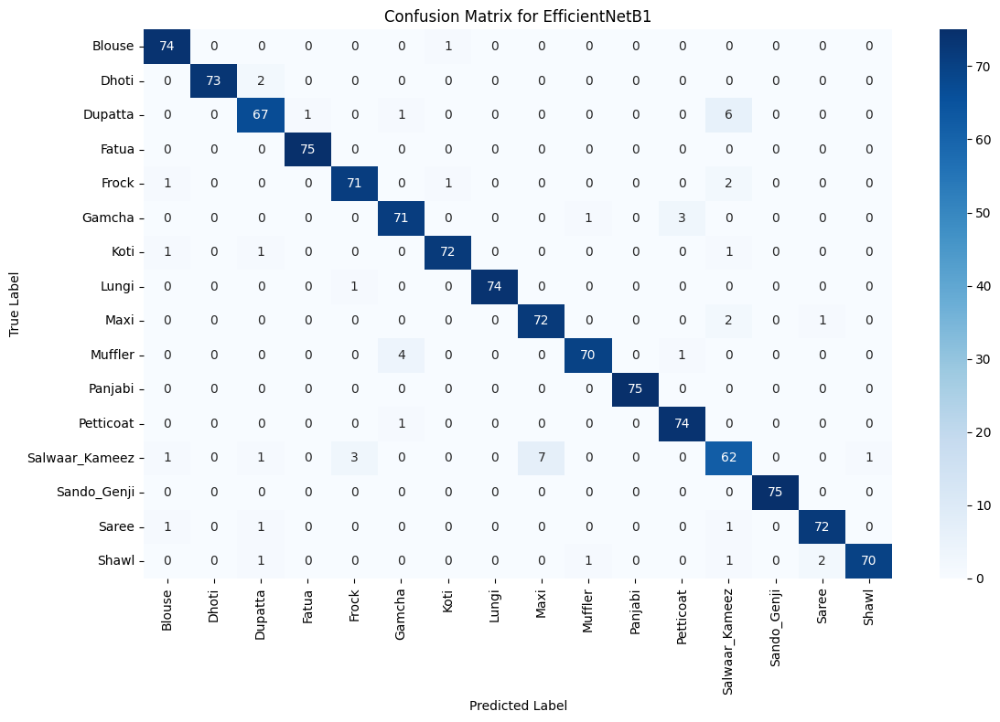

Confusion matrix plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/EfficientNetB1/EfficientNetB1_confusion_matrix.png


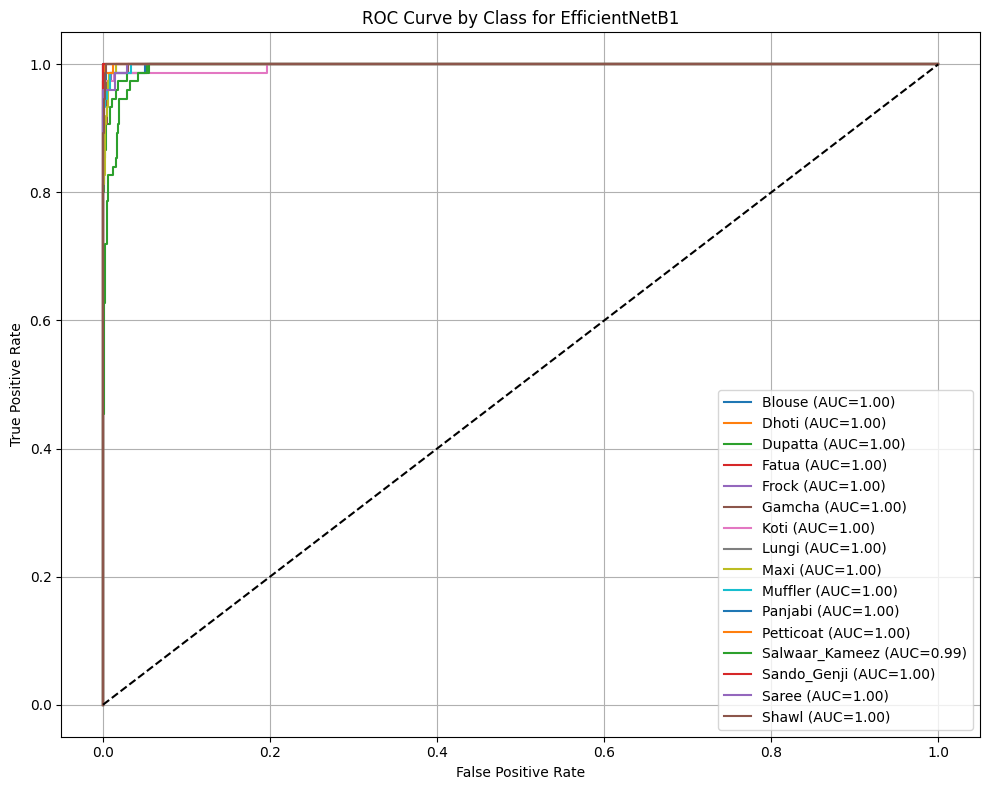

ROC curve plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/EfficientNetB1/EfficientNetB1_roc_curve.png

==== Performing Detailed Analysis for EfficientNetB1 ====
Total correct classifications: 1147
Total misclassifications: 53
Top 10 most confused class pairs saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/EfficientNetB1/EfficientNetB1_most_confused_classes.csv
Visualizing 10 random predictions with confidence scores...


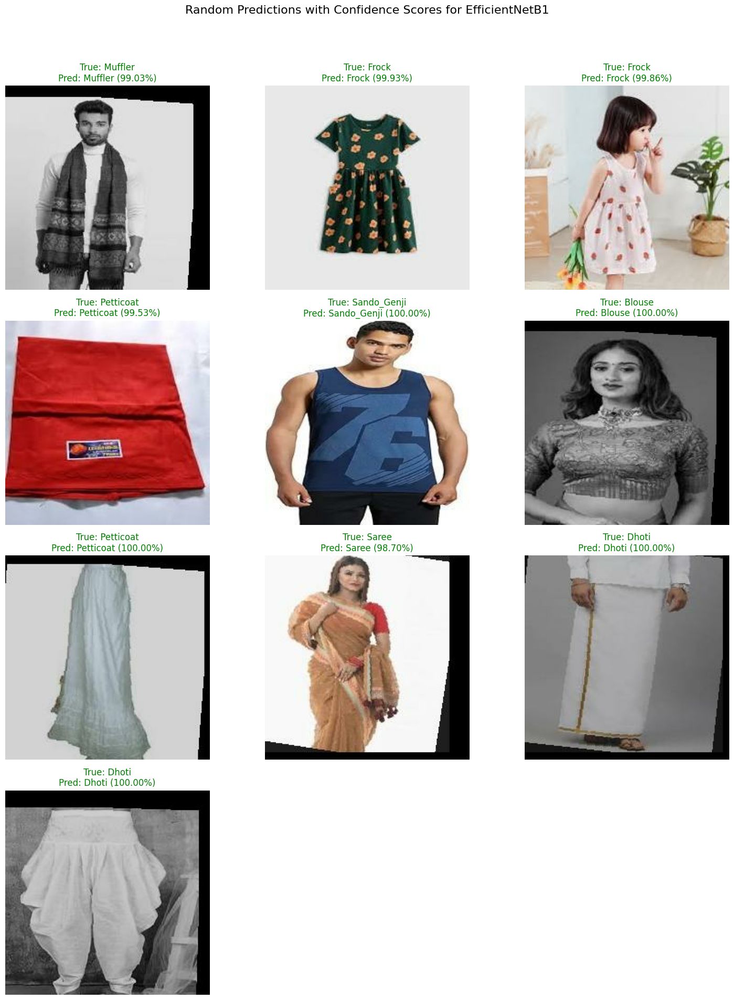

Random predictions with confidence scores plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/EfficientNetB1/EfficientNetB1_random_predictions_with_confidence.png

EfficientNetB1 Evaluation Complete. Final Val Acc: 0.9775
==================== Finished Processing for EfficientNetB1 ====================

==================== Starting Loading/Evaluation for DenseNet121 ====================
Attempting to load fully trained model for DenseNet121 from /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/DenseNet121/DenseNet121_best_weights.keras (SKIPPING TRAINING)...
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Model DenseNet121 recompiled for evaluation.
DenseNet121 fully loaded. Evaluation metrics will be re-generated. SKIPPING TRAINING PHASE.

==== Evaluating DenseNet121 Model ====
Overall Test Accuracy: 95.75%
DenseNet121_Overall scores saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/DenseNet1

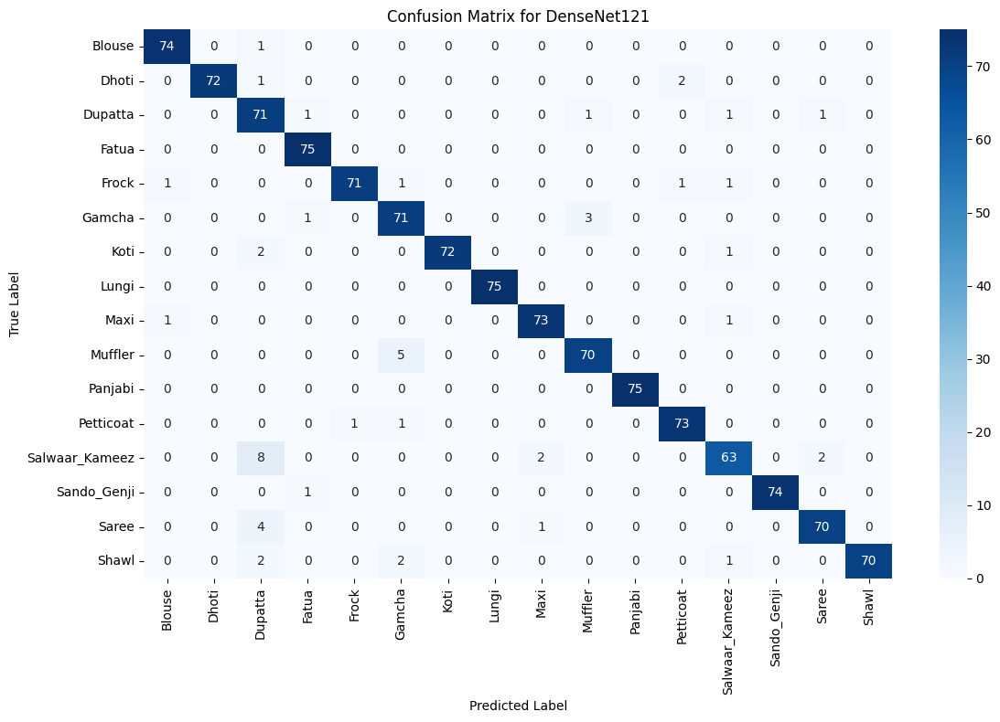

Confusion matrix plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/DenseNet121/DenseNet121_confusion_matrix.png


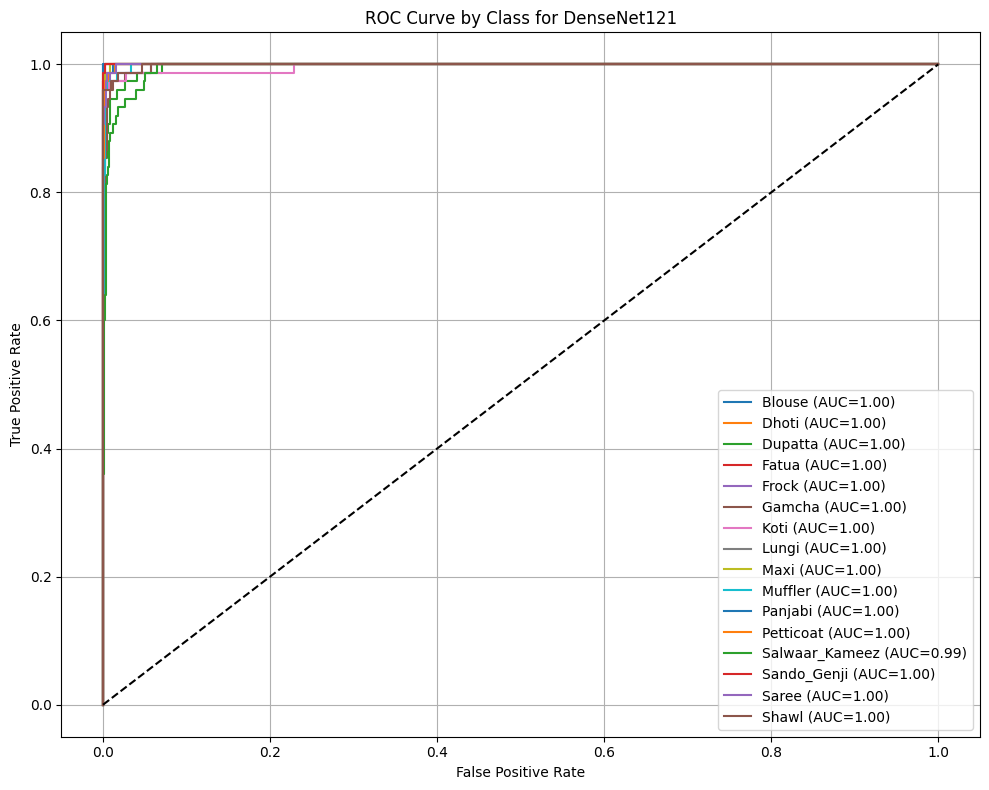

ROC curve plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/DenseNet121/DenseNet121_roc_curve.png

==== Performing Detailed Analysis for DenseNet121 ====
Total correct classifications: 1149
Total misclassifications: 51
Top 10 most confused class pairs saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/DenseNet121/DenseNet121_most_confused_classes.csv
Visualizing 10 random predictions with confidence scores...


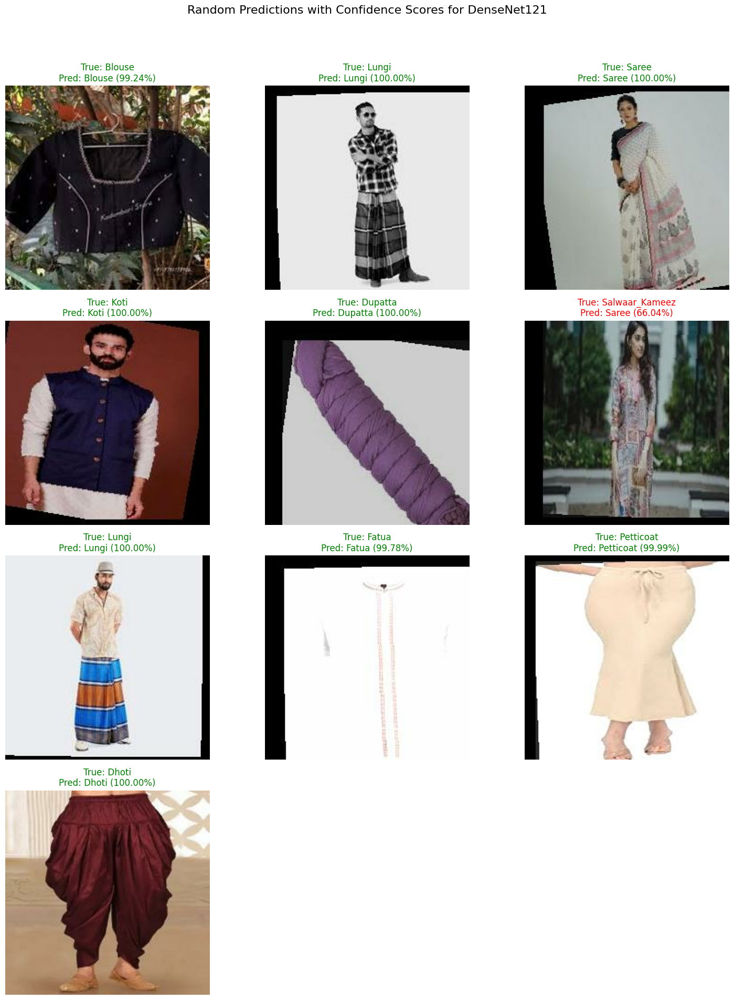

Random predictions with confidence scores plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/DenseNet121/DenseNet121_random_predictions_with_confidence.png

DenseNet121 Evaluation Complete. Final Val Acc: 0.9750
==================== Finished Processing for DenseNet121 ====================

==================== Starting Loading/Evaluation for Xception ====================
Attempting to load fully trained model for Xception from /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/Xception/Xception_best_weights.keras (SKIPPING TRAINING)...
83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Model Xception recompiled for evaluation.
Xception fully loaded. Evaluation metrics will be re-generated. SKIPPING TRAINING PHASE.

==== Evaluating Xception Model ====
Overall Test Accuracy: 94.75%
Xception_Overall scores saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/Xception/Xception_overall_scores.csv
Xception

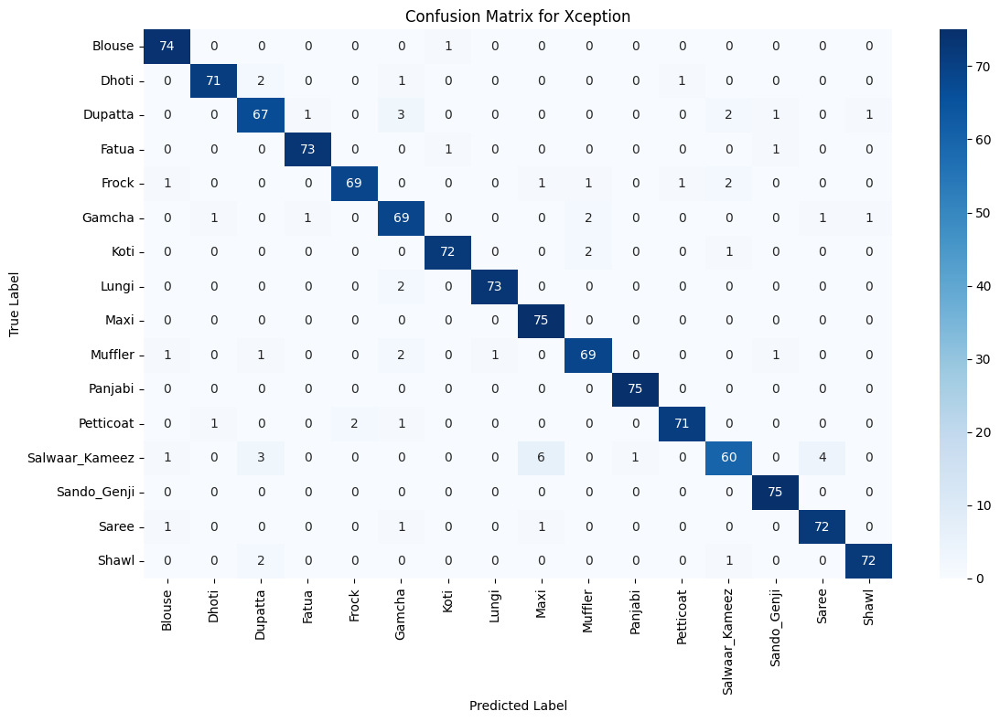

Confusion matrix plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/Xception/Xception_confusion_matrix.png


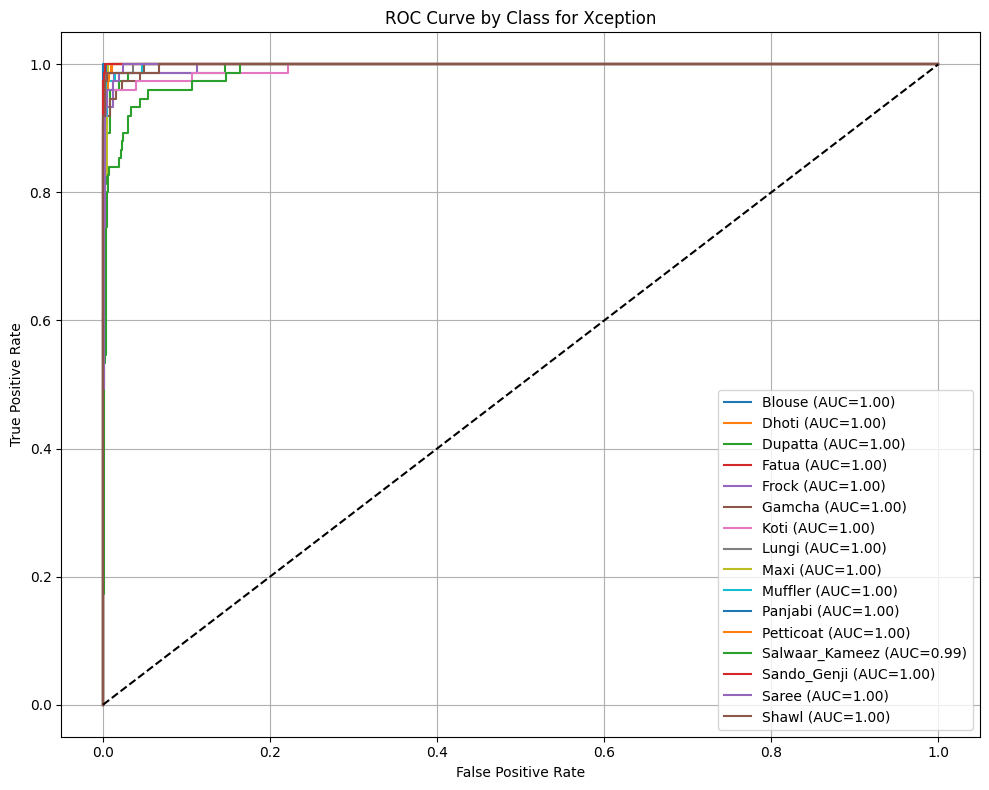

ROC curve plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/Xception/Xception_roc_curve.png

==== Performing Detailed Analysis for Xception ====
Total correct classifications: 1137
Total misclassifications: 63
Top 10 most confused class pairs saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/Xception/Xception_most_confused_classes.csv
Visualizing 10 random predictions with confidence scores...


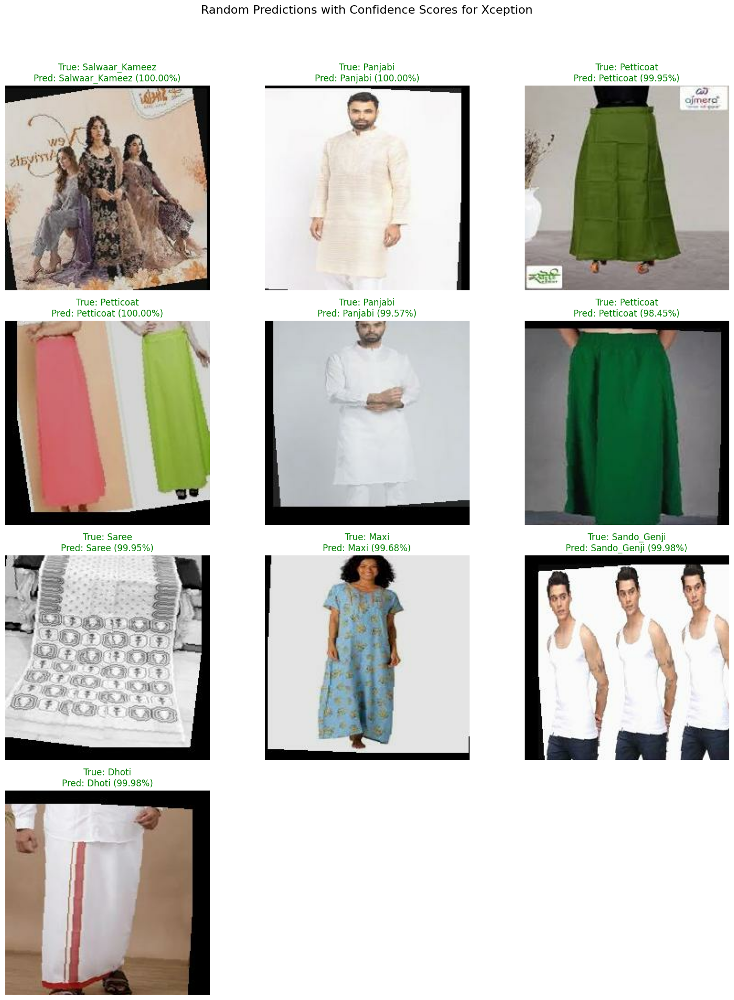

Random predictions with confidence scores plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Individual_Models/Xception/Xception_random_predictions_with_confidence.png

Xception Evaluation Complete. Final Val Acc: 0.9625
==================== Finished Processing for Xception ====================


In [ ]:
# --- Main training loop for all individual models ---
# Set initial_epoch_for_resume to None for normal operation (skip if done, else train from scratch)
# Set to an integer (e.g., 40) if you specifically want to resume a model from that epoch (it will only apply to the first model in the list that gets trained/resumed)
# Set to NONE here to ensure all models are SKIPPED if their .keras file exists, as they are already trained.
RESUME_EPOCH_FOR_FIRST_MODEL_IN_LIST = None

# REMOVED 'ConvNeXtTiny' from the list of models to train
individual_models_to_train = ['EfficientNetB1', 'DenseNet121', 'Xception']
trained_model_info = {} # Stores model objects, paths, and best validation accuracies

for model_idx, model_name in enumerate(individual_models_to_train):
    print(f"\n{'='*20} Starting Loading/Evaluation for {model_name} {'='*20}")

    model_output_dir = os.path.join(BASE_OUTPUT_DIR, 'Individual_Models', model_name)
    os.makedirs(model_output_dir, exist_ok=True) # Ensure output directory exists
    model_weights_path = os.path.join(model_output_dir, f'{model_name}_best_weights.keras')

    # Initialize model objects for the current iteration
    model = None
    base_model = None
    feature_extractor_model = None

    # In this scenario, we assume models are already trained, so we'll always try to load and skip training.
    # The 'model_needs_training_this_run' flag below will thus be effectively False.

    # --- Logic for loading pre-trained models and generating results ---
    if os.path.exists(model_weights_path):
        try:
            print(f"Attempting to load fully trained model for {model_name} from {model_weights_path} (SKIPPING TRAINING)...")
            # Create model architecture first, then load weights
            keras.backend.clear_session()
            gc.collect()
            model, base_model, feature_extractor_model = create_model_for_training(model_name, IMG_SIZE + (3,), nb_classes)
            model.load_weights(model_weights_path)

            # --- NEW: Recompile the model for evaluation after loading weights ---
            # Use the same compile settings as your fine-tuning phase
            base_model.trainable = True # Assume base model was trainable in final fine-tuning
            model.compile(
                optimizer=keras.optimizers.Adam(1e-5), # Same optimizer and learning rate as fine-tuning
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy']
            )
            print(f"Model {model_name} recompiled for evaluation.")

            # Since we are just loading and evaluating, training is effectively skipped.
            # No 'model_needs_training_this_run = True'
            print(f"{model_name} fully loaded. Evaluation metrics will be re-generated. SKIPPING TRAINING PHASE.")

        except Exception as e:
            print(f"Error loading full model for {model_name} from {model_weights_path} to evaluate: {e}")
            print(f"Please ensure the model was trained and saved correctly. Skipping {model_name}.")
            continue # Skip to next model if loading fails
    else:
        print(f"Error: Model weights not found for {model_name} at {model_weights_path}. Cannot generate results without trained model.")
        print("Please run the training phase for this model first. Skipping.")
        continue # Skip to next model if weights are not found

    # --- The rest of this block runs for loaded models to collect metrics ---
    # The 'model' and 'feature_extractor_model' variables are guaranteed to hold the correct instances
    # for the current model as they were loaded and recompiled above.

    # Run full evaluation on test set to get comprehensive reports and also test_overall_accuracy
    # This also saves the classification_report.csv which is read later for overall metrics.
    test_overall_accuracy, test_pred_probs_val = evaluate_and_save_results(model, test_dataset, test_true_labels_arr, class_names, model_output_dir, prefix=f"{model_name}_")

    # Get features for ensembling
    test_features_val = feature_extractor_model.predict(test_dataset, verbose=0)
    val_features_val = feature_extractor_model.predict(validation_dataset, verbose=0)

    # Re-evaluate training accuracy for the final overall summary table
    _, train_acc_final = model.evaluate(train_dataset, verbose=0)

    # Re-evaluate validation accuracy for the final overall summary table
    _, val_acc_final = model.evaluate(validation_dataset, verbose=0)

    # Recalculate overall Precision, Recall, F1, ROC AUC using test predictions for the summary table
    test_pred_probs_for_metrics = model.predict(test_dataset, verbose=0)
    test_pred_labels_for_metrics = np.argmax(test_pred_probs_for_metrics, axis=1)

    overall_report = classification_report(test_true_labels_arr, test_pred_labels_for_metrics, target_names=class_names, output_dict=True)
    overall_precision_weighted = overall_report['weighted avg']['precision']
    overall_recall_weighted = overall_report['weighted avg']['recall']
    overall_f1_weighted = overall_report['weighted avg']['f1-score']

    if len(np.unique(test_true_labels_arr)) > 1 and len(np.unique(test_pred_labels_for_metrics)) > 1:
        overall_roc_auc_macro = roc_auc_score(test_true_labels_arr, test_pred_probs_for_metrics, multi_class='ovr', average='macro')
    else:
        overall_roc_auc_macro = np.nan

    perform_detailed_error_analysis(test_pred_probs_for_metrics, test_true_labels_arr, class_names, model_output_dir, prefix=f"{model_name}_", num_samples=10) # num_samples=10 as requested

    # --- Store ALL collected metrics and data into trained_model_info ---
    trained_model_info[model_name] = {
        'model_path': model_weights_path,
        'train_accuracy': train_acc_final,
        'val_accuracy': val_acc_final,
        'test_overall_accuracy': test_overall_accuracy,
        'test_precision': overall_precision_weighted,
        'test_recall': overall_recall_weighted,
        'test_f1': overall_f1_weighted,
        'test_roc_auc': overall_roc_auc_macro,
        'test_pred_probs': test_pred_probs_for_metrics,
        'val_pred_probs': model.predict(validation_dataset, verbose=0),
        'test_features': test_features_val,
        'val_features': val_features_val
    }
    print(f"\n{model_name} Evaluation Complete. Final Val Acc: {val_acc_final:.4f}")
    print(f"{'='*20} Finished Processing for {model_name} {'='*20}")

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# --- NEW BLOCK: Generate Individual Model Summary Tables from Saved Results ---
# This block is designed to be run AFTER all individual models have completed their runs
# and saved their respective output files. It rebuilds 'trained_model_info' from saved data
# and recalculates missing metrics to present summary tables without NaN values.

print(f"\n{'='*20} Rebuilding Individual Model Performance Summary {'='*20}")

# Re-initialize trained_model_info. This is crucial if you've reconnected runtime or
# are running this block separately from the training loop.
trained_model_info = {}

# Ensure this list matches the models you intend to train and whose results you want to summarize
# Confirmed removal of 'ConvNeXtTiny' from this list.
individual_models_to_train = ['EfficientNetB1', 'DenseNet121', 'Xception']

# Define BASE_OUTPUT_DIR as confirmed by you. This should point to the directory
# where your 'Individual_Models' folder is located.
BASE_OUTPUT_DIR = '/content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/'

for model_name in individual_models_to_train:
    print(f"\n--- Processing saved results for {model_name} ---")
    model_output_dir = os.path.join(BASE_OUTPUT_DIR, 'Individual_Models', model_name)
    model_weights_path = os.path.join(model_output_dir, f'{model_name}_best_weights.keras')

    # --- Step 1: Verify model presence and load model for evaluation ---
    if not os.path.exists(model_weights_path):
        print(f"Warning: Model weights not found for {model_name} at {model_weights_path}. Skipping this model for summary.")
        continue # Skip to the next model if its weights file is missing

    try:
        # Clear Keras session and garbage collect for memory management
        keras.backend.clear_session()
        gc.collect()

        # Load the complete model (architecture + weights) for re-evaluation
        # This requires the create_model_for_training function to be defined upstream
        model = tf.keras.models.load_model(model_weights_path)

        # Create a feature extractor from the loaded model (needed for ensemble features later)
        # This part needs to mirror the feature extractor creation in create_model_for_training
        # For consistency, we need to apply augmentation and preprocessing layers.

        # Determine base model layer name (this needs to be robust)
        # Note: ConvNeXtTiny is removed, so no 'convnext_tiny' reference here.
        base_model_layer_name = None
        if model_name == 'EfficientNetB1': base_model_layer_name = 'efficientnetb1'
        elif model_name == 'DenseNet121': base_model_layer_name = 'densenet121'
        elif model_name == 'Xception': base_model_layer_name = 'xception'

        # Access layers by name, robust to functional API specifics
        loaded_base_model_layer = model.get_layer(base_model_layer_name)

        # Reconstruct preprocessing path for feature extractor
        feature_extractor_inputs = model.inputs[0] # Original image input (model's first input)
        x_aug_for_extractor = model.get_layer("data_augmentation_layer")(feature_extractor_inputs)

        # Handling preprocessing layers (these can be functional or built-in, check summary())
        # The logic below accounts for EfficientNet, DenseNet, Xception's specific preprocessing layers.
        # ConvNeXtTiny's special handling is no longer needed/present.
        x_processed_for_extractor = x_aug_for_extractor
        if 'efficientnetb1_preprocessing' in [layer.name for layer in model.layers]:
            x_processed_for_extractor = model.get_layer('efficientnetb1_preprocessing')(x_aug_for_extractor)
        elif 'densenet121_preprocessing' in [layer.name for layer in model.layers]:
            x_processed_for_extractor = model.get_layer('densenet121_preprocessing')(x_aug_for_extractor)
        elif 'xception_preprocessing' in [layer.name for layer in model.layers]:
            x_processed_for_extractor = model.get_layer('xception_preprocessing')(x_aug_for_extractor)
        # Add fallback for rescaling/normalization layers if specific preprocessing layers are not found
        elif 'rescaling' in [layer.name for layer in model.layers] and 'normalization' in [layer.name for layer in model.layers]:
             x_processed_for_extractor = model.get_layer('rescaling')(model.get_layer('normalization')(x_aug_for_extractor))

        features_loaded = loaded_base_model_layer(x_processed_for_extractor, training=False)
        feature_extractor_model = keras.Model(inputs=feature_extractor_inputs, outputs=features_loaded, name=f"{model_name}_reloaded_feature_extractor")

        print(f"Model {model_name} loaded successfully from disk for evaluation.")

        # --- Step 2: Read primary metrics from saved CSVs ---
        overall_scores_df = pd.read_csv(os.path.join(model_output_dir, f"{model_name}_overall_scores.csv"))
        classification_report_df = pd.read_csv(os.path.join(model_output_dir, f"{model_name}_classification_report.csv"), index_col=0)

        # --- Step 3: Recalculate/Retrieve all required metrics for trained_model_info ---

        # Test Overall Accuracy (from overall_scores.csv)
        test_overall_accuracy_val = overall_scores_df[overall_scores_df['Metric'] == 'Test Accuracy']['Score'].iloc[0]

        # Training Accuracy (RE-EVALUATE by predicting on train_dataset)
        # Note: train_dataset must be available in the Colab session
        _, train_acc_final = model.evaluate(train_dataset, verbose=0)

        # Validation Accuracy (RE-EVALUATE by predicting on validation_dataset)
        # Note: validation_dataset must be available in the Colab session
        _, val_acc_final = model.evaluate(validation_dataset, verbose=0)

        # Overall Precision, Recall, F1 (from classification_report.csv)
        overall_precision_weighted = classification_report_df.loc['weighted avg', 'precision']
        overall_recall_weighted = classification_report_df.loc['weighted avg', 'recall']
        overall_f1_weighted = classification_report_df.loc['weighted avg', 'f1-score']

        # Get test predictions for ROC AUC calculation and for ensembling later
        # Note: test_dataset and test_true_labels_arr must be available in the Colab session
        test_pred_probs = model.predict(test_dataset, verbose=0)
        test_pred_labels = np.argmax(test_pred_probs, axis=1)

        # Overall ROC AUC (macro average)
        if len(np.unique(test_true_labels_arr)) > 1 and len(np.unique(test_pred_labels)) > 1:
            overall_roc_auc_macro = roc_auc_score(test_true_labels_arr, test_pred_probs, multi_class='ovr', average='macro')
        else:
            overall_roc_auc_macro = np.nan # Cannot compute ROC AUC if only one class present in true/pred labels

        # Get val_pred_probs for ensembling (re-predict on validation_dataset)
        val_pred_probs = model.predict(validation_dataset, verbose=0)

        # Get features for ensembling (re-predict using feature_extractor_model)
        test_features = feature_extractor_model.predict(test_dataset, verbose=0)
        val_features = feature_extractor_model.predict(validation_dataset, verbose=0)

        # --- Step 4: Populate trained_model_info for this model ---
        trained_model_info[model_name] = {
            'model_path': model_weights_path,
            'train_accuracy': train_acc_final,
            'val_accuracy': val_acc_final,
            'test_overall_accuracy': test_overall_accuracy_val,
            'test_precision': overall_precision_weighted,
            'test_recall': overall_recall_weighted,
            'test_f1': overall_f1_weighted,
            'test_roc_auc': overall_roc_auc_macro,
            'test_pred_probs': test_pred_probs, # Store for ensembling
            'val_pred_probs': val_pred_probs,  # Store for ensembling
            'test_features': test_features,    # Store for ensembling
            'val_features': val_features       # Store for ensembling
        }
        print(f"Successfully processed and stored results for {model_name}.")

    except FileNotFoundError as fnfe:
        print(f"Error: Required file not found for {model_name} (e.g., {fnfe}). Ensure model ran completely and saved all outputs.")
    except KeyError as ke:
        print(f"Error: Missing expected column/index in CSV for {model_name} ({ke}). Check report structure.")
    except Exception as e:
        print(f"An unexpected error occurred while processing {model_name}'s results: {e}. Skipping this model.")

    # If an error occurred and model_name wasn't added, ensure it's not present for summary
    if model_name not in trained_model_info:
        print(f"Skipped {model_name} due to previous error. It will not appear in summaries or ensembles.")

# --- Generate Table 1: Overall Model Performance Summary ---
overall_performance_data = []

for model_name in individual_models_to_train:
    model_info = trained_model_info.get(model_name)
    if model_info is None:
        continue # Skip if information wasn't successfully loaded/processed

    overall_performance_data.append({
        'Model Name': model_name,
        'Training Acc': f"{model_info['train_accuracy']:.4f}",
        'Val Acc': f"{model_info['val_accuracy']:.4f}",
        'Test Overall Accuracy': f"{model_info['test_overall_accuracy']:.4f}",
        'Precision': f"{model_info['test_precision']:.4f}",
        'Recall': f"{model_info['test_recall']:.4f}",
        'F1': f"{model_info['test_f1']:.4f}",
        'ROC-AUC (Macro)': f"{model_info['test_roc_auc']:.4f}"
    })

overall_performance_df = pd.DataFrame(overall_performance_data)
print("\nOverall Model Performance:")
print(overall_performance_df.to_string(index=False)) # Use to_string to prevent truncation in Colab
overall_performance_df.to_csv(os.path.join(BASE_OUTPUT_DIR, 'Summary_Overall_Model_Performance.csv'), index=False)
print(f"Overall model performance table saved to: {os.path.join(BASE_OUTPUT_DIR, 'Summary_Overall_Model_Performance.csv')}")


# --- Generate Table 2: Class-wise Performance (Combined for All Models) ---
class_wise_data_all_models = []

for model_name in individual_models_to_train:
    model_output_dir = os.path.join(BASE_OUTPUT_DIR, 'Individual_Models', model_name)
    try:
        # Load the classification report from disk, which contains per-class metrics
        report_df = pd.read_csv(os.path.join(model_output_dir, f"{model_name}_classification_report.csv"), index_col=0)

        # Filter out aggregate rows like 'accuracy', 'macro avg', 'weighted avg'
        class_specific_rows = [c for c in class_names if c in report_df.index and c not in ['accuracy', 'macro avg', 'weighted avg']]

        for class_name in class_specific_rows:
            class_wise_data_all_models.append({
                'Model Name': model_name,
                'Class': class_name,
                'Precision': f"{report_df.loc[class_name, 'precision']:.4f}",
                'Recall': f"{report_df.loc[class_name, 'recall']:.4f}",
                'F1 Score': f"{report_df.loc[class_name, 'f1-score']:.4f}"
            })
    except FileNotFoundError:
        print(f"Warning: classification_report.csv not found for {model_name}. Skipping class-wise data for this model.")
    except KeyError as e:
        print(f"Warning: Missing key {e} in classification report for {model_name}. Check report structure.")

class_wise_performance_df = pd.DataFrame(class_wise_data_all_models)
print("\nClass-wise Performance for All Models:")
print(class_wise_performance_df.to_string(index=False))
class_wise_performance_df.to_csv(os.path.join(BASE_OUTPUT_DIR, 'Summary_Class_Wise_Performance.csv'), index=False)
print(f"Class-wise performance table saved to: {os.path.join(BASE_OUTPUT_DIR, 'Summary_Class_Wise_Performance.csv')}")

print(f"\n{'='*20} End of Individual Model Summary {'='*20}")


==================== Rebuilding Individual Model Performance Summary ====================

--- Processing saved results for EfficientNetB1 ---
Model EfficientNetB1 loaded successfully from disk for evaluation.
Successfully processed and stored results for EfficientNetB1.

--- Processing saved results for DenseNet121 ---
Model DenseNet121 loaded successfully from disk for evaluation.
Successfully processed and stored results for DenseNet121.

--- Processing saved results for Xception ---
Model Xception loaded successfully from disk for evaluation.
Successfully processed and stored results for Xception.

Overall Model Performance:
    Model Name Training Acc Val Acc Test Overall Accuracy Precision Recall     F1 ROC-AUC (Macro)
EfficientNetB1       0.9987  0.9775                0.9558    0.9563 0.9558 0.9558          0.9991
   DenseNet121       0.9993  0.9750                0.9575    0.9599 0.9575 0.9579          0.9989
      Xception       0.9989  0.9625                0.9475    0.9479 


==================== Starting Ensemble Operations ====================

--- Running Ensemble: Weighted_Avg_EfficientNetB1_DenseNet121_Xception (weighted_avg) ---

==== Evaluating Ensemble: Weighted Avg EfficientNetB1 DenseNet121 Xception ====
Overall Test Accuracy (Weighted Avg EfficientNetB1 DenseNet121 Xception): 96.75%
Weighted_Avg_EfficientNetB1_DenseNet121_Xception Overall scores saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Weighted_Avg_EfficientNetB1_DenseNet121_Xception/Weighted_Avg_EfficientNetB1_DenseNet121_Xception_overall_scores.csv
Weighted_Avg_EfficientNetB1_DenseNet121_Xception Classification report saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Weighted_Avg_EfficientNetB1_DenseNet121_Xception/Weighted_Avg_EfficientNetB1_DenseNet121_Xception_classification_report.csv
Weighted_Avg_EfficientNetB1_DenseNet121_Xception Class-wise metrics saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Weighted_

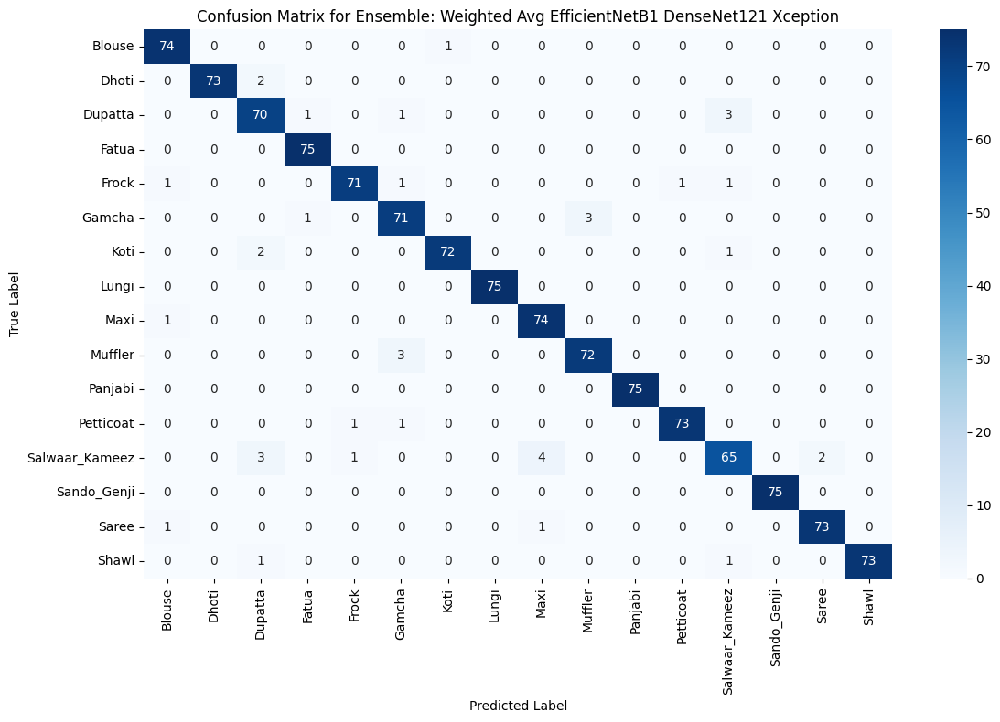

Confusion matrix plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Weighted_Avg_EfficientNetB1_DenseNet121_Xception/Weighted_Avg_EfficientNetB1_DenseNet121_Xception_confusion_matrix.png


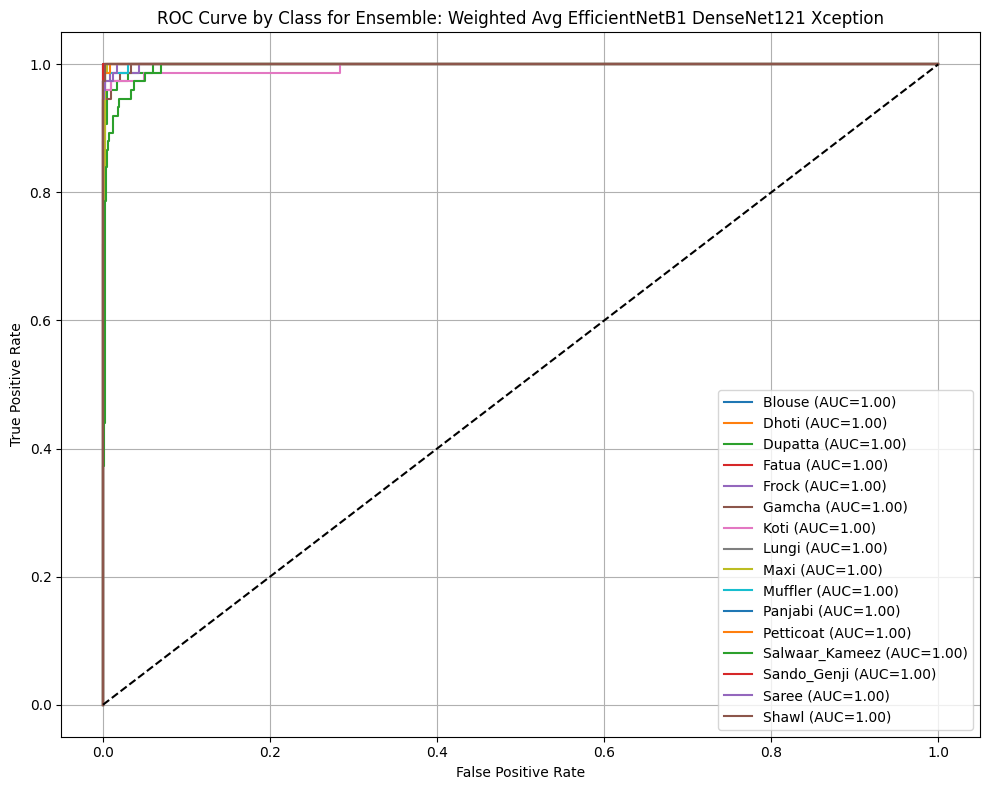

ROC curve plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Weighted_Avg_EfficientNetB1_DenseNet121_Xception/Weighted_Avg_EfficientNetB1_DenseNet121_Xception_roc_curve.png

==== Performing Detailed Analysis for Weighted Avg EfficientNetB1 DenseNet121 Xception ====
Total correct classifications: 1161
Total misclassifications: 39
Top 10 most confused class pairs saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Weighted_Avg_EfficientNetB1_DenseNet121_Xception/Weighted_Avg_EfficientNetB1_DenseNet121_Xception_most_confused_classes.csv
Visualizing 10 random predictions with confidence scores...


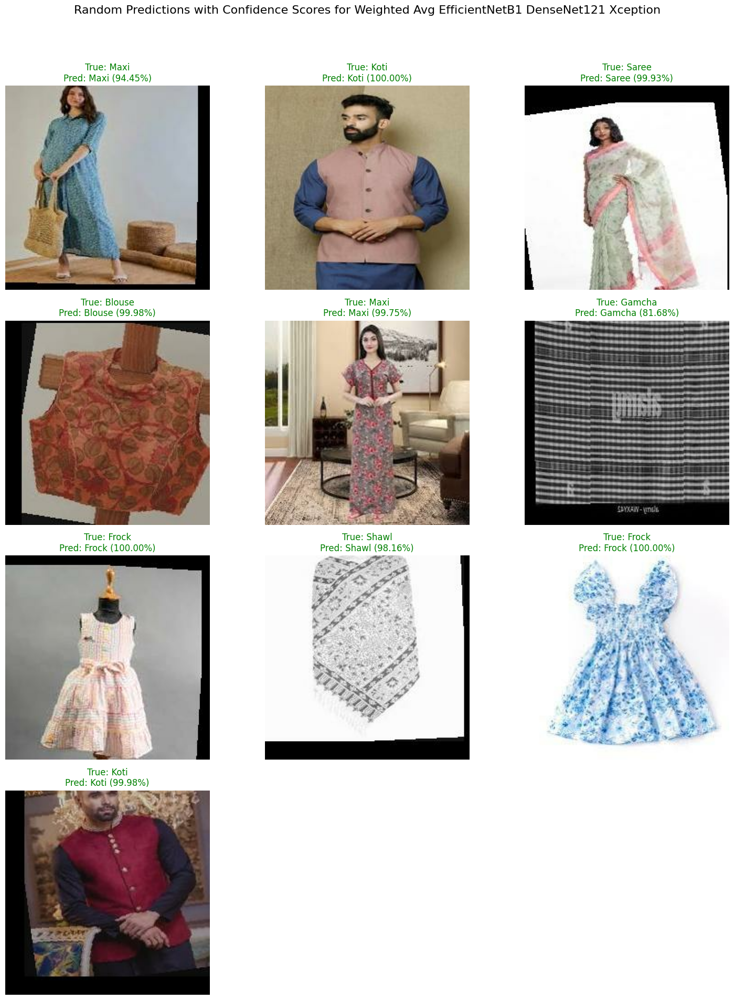

Random predictions with confidence scores plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Weighted_Avg_EfficientNetB1_DenseNet121_Xception/Weighted_Avg_EfficientNetB1_DenseNet121_Xception_random_predictions_with_confidence.png

--- Running Ensemble: Stacking_LR_EfficientNetB1_DenseNet121_Xception (lr_stacking_probs) ---
Training LR meta-learner for Stacking_LR_EfficientNetB1_DenseNet121_Xception...

==== Evaluating Ensemble: Stacking LR EfficientNetB1 DenseNet121 Xception ====
Overall Test Accuracy (Stacking LR EfficientNetB1 DenseNet121 Xception): 96.58%


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Stacking_LR_EfficientNetB1_DenseNet121_Xception Overall scores saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_LR_EfficientNetB1_DenseNet121_Xception/Stacking_LR_EfficientNetB1_DenseNet121_Xception_overall_scores.csv
Stacking_LR_EfficientNetB1_DenseNet121_Xception Classification report saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_LR_EfficientNetB1_DenseNet121_Xception/Stacking_LR_EfficientNetB1_DenseNet121_Xception_classification_report.csv
Stacking_LR_EfficientNetB1_DenseNet121_Xception Class-wise metrics saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_LR_EfficientNetB1_DenseNet121_Xception/Stacking_LR_EfficientNetB1_DenseNet121_Xception_classwise_metrics.csv


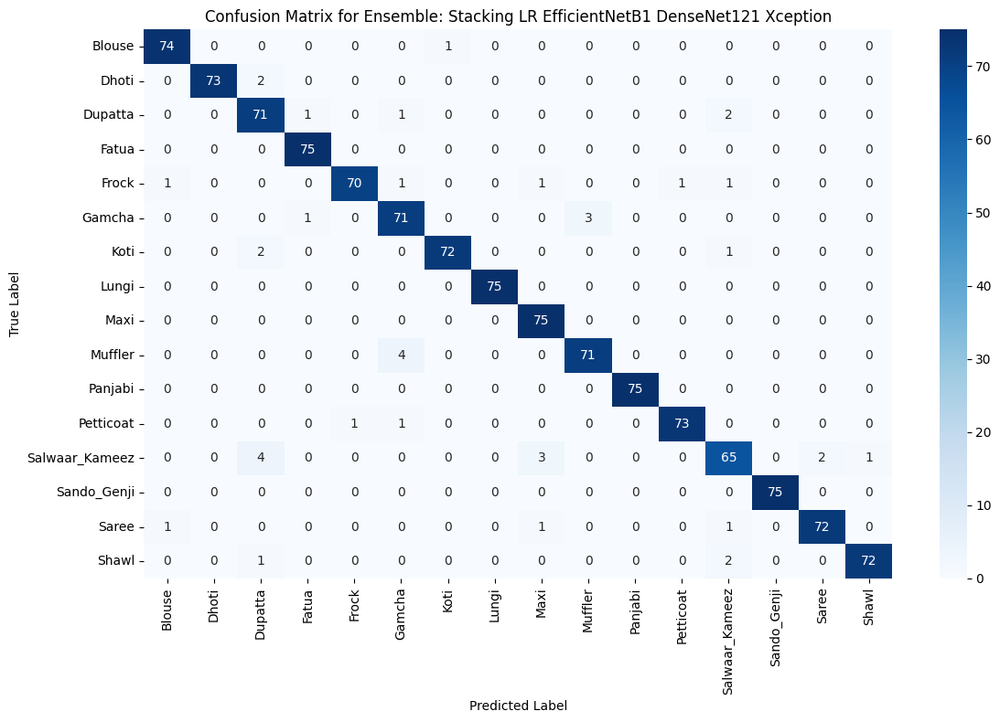

Confusion matrix plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_LR_EfficientNetB1_DenseNet121_Xception/Stacking_LR_EfficientNetB1_DenseNet121_Xception_confusion_matrix.png


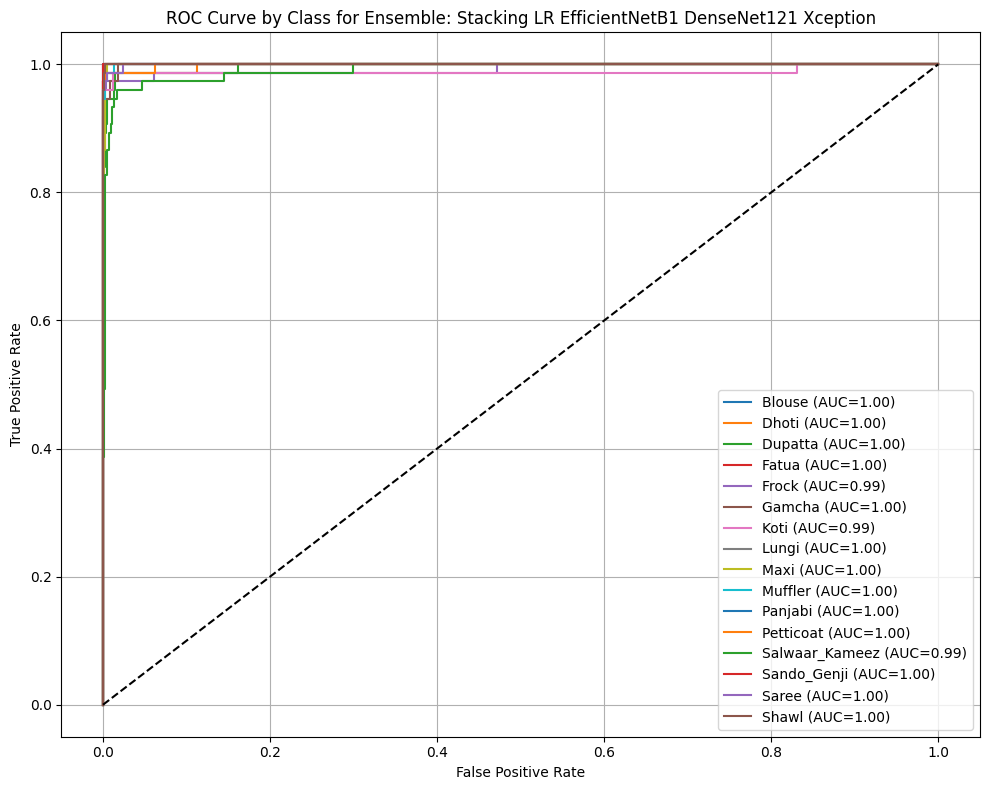

ROC curve plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_LR_EfficientNetB1_DenseNet121_Xception/Stacking_LR_EfficientNetB1_DenseNet121_Xception_roc_curve.png

==== Performing Detailed Analysis for Stacking LR EfficientNetB1 DenseNet121 Xception ====
Total correct classifications: 1159
Total misclassifications: 41
Top 10 most confused class pairs saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_LR_EfficientNetB1_DenseNet121_Xception/Stacking_LR_EfficientNetB1_DenseNet121_Xception_most_confused_classes.csv
Visualizing 10 random predictions with confidence scores...


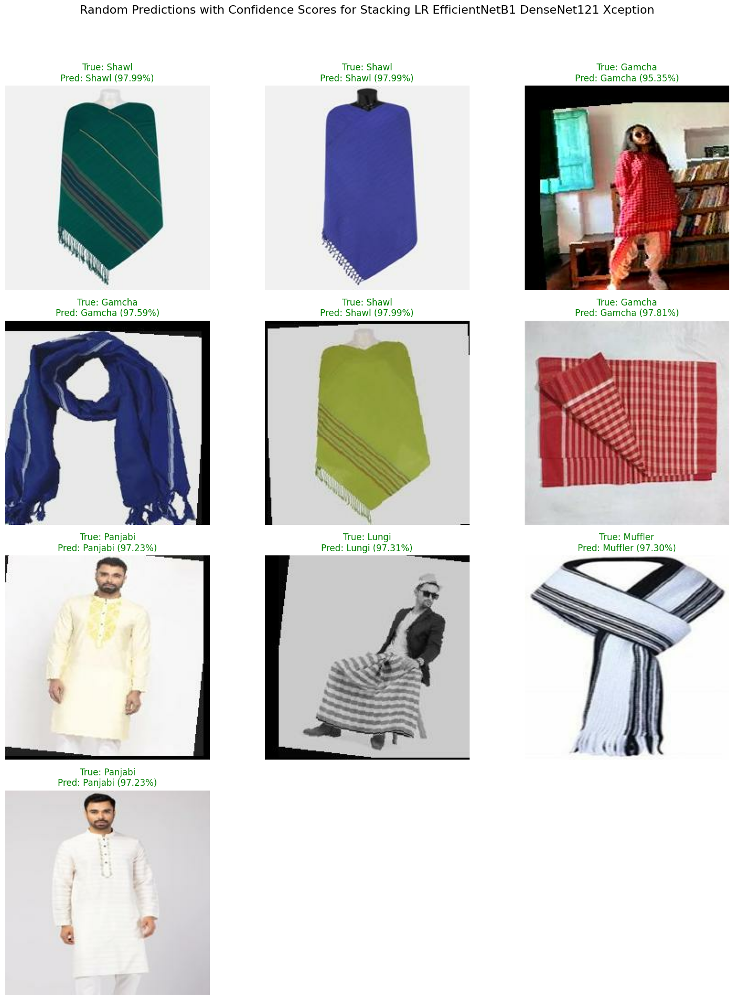

Random predictions with confidence scores plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_LR_EfficientNetB1_DenseNet121_Xception/Stacking_LR_EfficientNetB1_DenseNet121_Xception_random_predictions_with_confidence.png

--- Running Ensemble: Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception (mlp_stacking_probs) ---
Training MLP (Probabilities) meta-learner for Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception...
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step

==== Evaluating Ensemble: Stacking MLP Prob EfficientNetB1 DenseNet121 Xception ====
Overall Test Accuracy (Stacking MLP Prob EfficientNetB1 DenseNet121 Xception): 96.50%
Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception Overall scores saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception_overall_scores.csv
Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception Cla

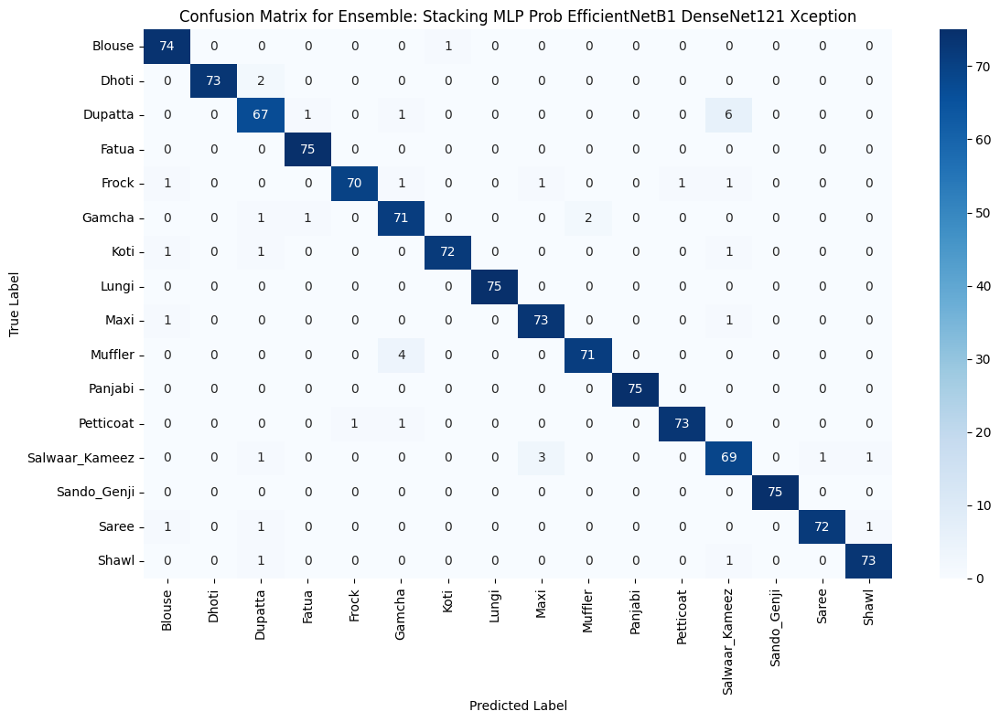

Confusion matrix plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception_confusion_matrix.png


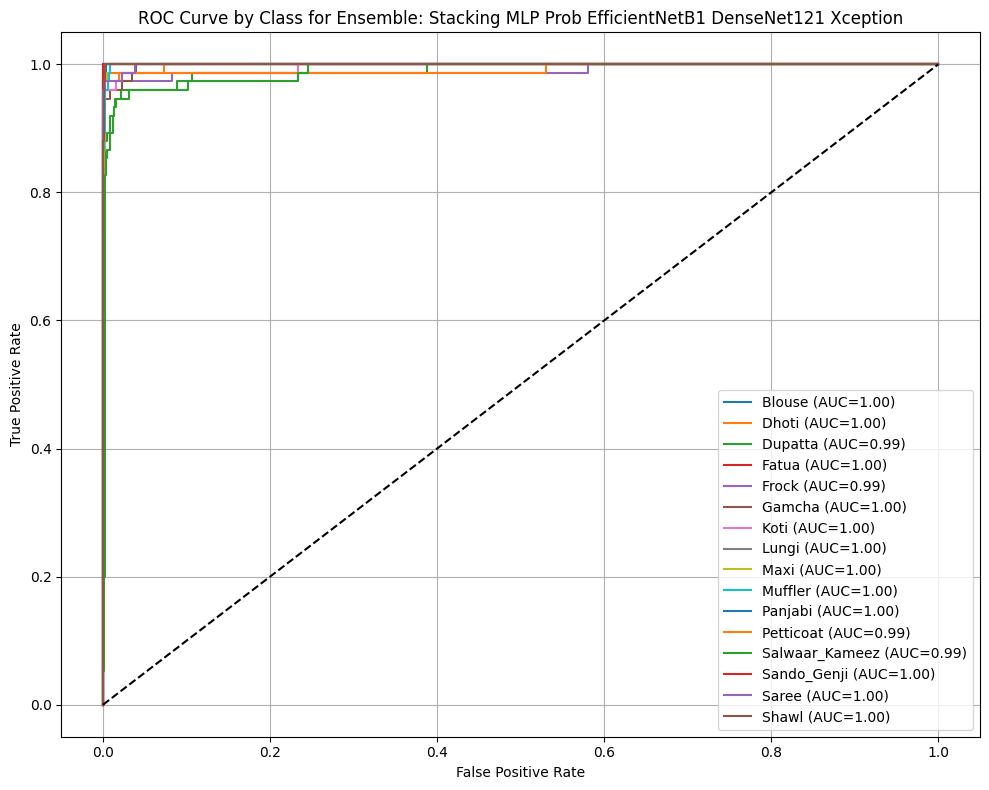

ROC curve plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception_roc_curve.png

==== Performing Detailed Analysis for Stacking MLP Prob EfficientNetB1 DenseNet121 Xception ====
Total correct classifications: 1158
Total misclassifications: 42
Top 10 most confused class pairs saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception_most_confused_classes.csv
Visualizing 10 random predictions with confidence scores...


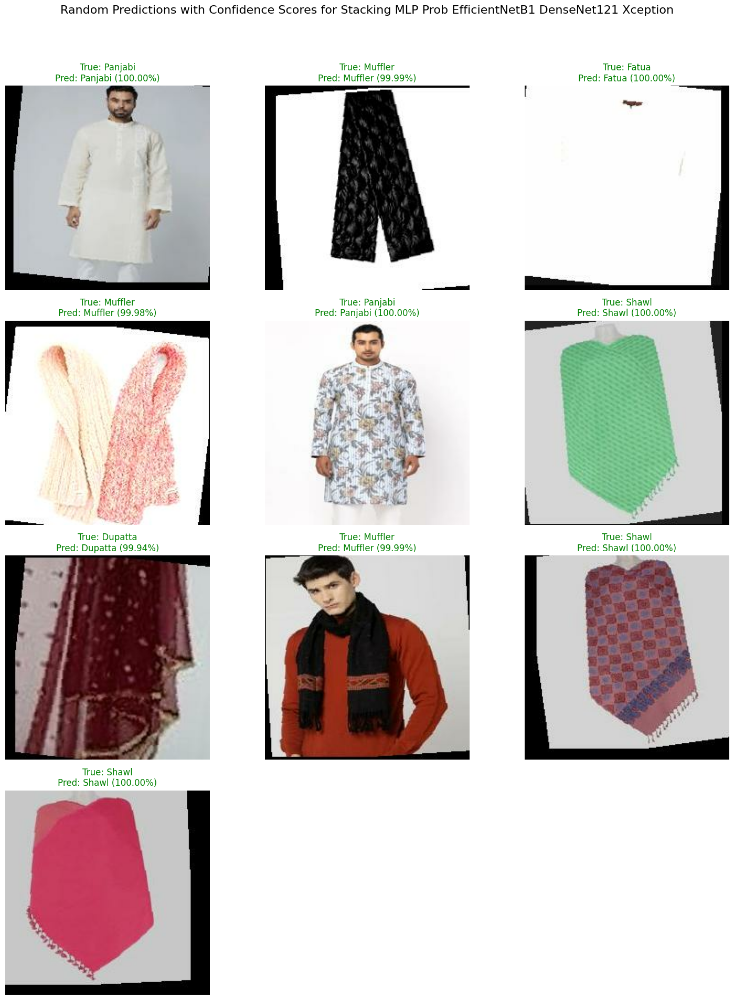

Random predictions with confidence scores plot saved to /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Ensembles/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception/Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception_random_predictions_with_confidence.png

==================== All Ensemble Operations Complete ====================
All results, figures, and tables saved to: /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/


In [ ]:
# --- Ensemble Setup and Execution ---
print(f"\n{'='*20} Starting Ensemble Operations {'='*20}")

# --- ENSEMBLE DEFINITIONS ---
# Each tuple defines an ensemble: (name, model_keys, ensemble_type)
# ensemble_type can be 'weighted_avg', 'lr_stacking_probs', 'mlp_stacking_probs', 'mlp_stacking_features'
all_ensembles_configs = [
    # Explicitly including only the 3 specified ensembles, all using EfficientNetB1, DenseNet121, Xception
    ("Weighted_Avg_EfficientNetB1_DenseNet121_Xception", ['EfficientNetB1', 'DenseNet121', 'Xception'], 'weighted_avg'),
    ("Stacking_LR_EfficientNetB1_DenseNet121_Xception", ['EfficientNetB1', 'DenseNet121', 'Xception'], 'lr_stacking_probs'),
    ("Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception", ['EfficientNetB1', 'DenseNet121', 'Xception'], 'mlp_stacking_probs'),
    # Removed Stacking_MLP_Feat_EfficientNetB1_DenseNet121_Xception as it was not part of the 3 types specified
]

# List to store overall performance data for all ensembles for a summary table
ensemble_performance_data = []
# List to store class-wise performance data for all ensembles
ensemble_class_wise_data_all_ensembles = []


for ensemble_name, model_keys, ensemble_type in all_ensembles_configs:
    print(f"\n--- Running Ensemble: {ensemble_name} ({ensemble_type}) ---")

    # Check if all required base models were trained successfully (from trained_model_info)
    if not all(key in trained_model_info for key in model_keys):
        print(f"Skipping {ensemble_name}: Not all required base models trained successfully.")
        continue

    ensemble_output_dir = os.path.join(BASE_OUTPUT_DIR, 'Ensembles', ensemble_name)
    os.makedirs(ensemble_output_dir, exist_ok=True)

    ensemble_predictions = None # Will store predicted probabilities from the ensemble
    meta_learner_val_acc_for_summary = np.nan # Default for ensembles without explicit meta-learner val_acc

    if ensemble_type == 'weighted_avg':
        weights = np.array([trained_model_info[name]['val_accuracy'] for name in model_keys])
        weights = weights / np.sum(weights) # Normalize weights
        ensemble_predictions = np.sum([weights[i] * trained_model_info[model_keys[i]]['test_pred_probs'] for i in range(len(model_keys))], axis=0)
        # Weighted avg doesn't have a meta-learner training phase, so no meta_learner_val_acc

    elif ensemble_type == 'lr_stacking_probs':
        meta_train_features = np.hstack([trained_model_info[name]['val_pred_probs'] for name in model_keys])
        meta_test_features = np.hstack([trained_model_info[name]['test_pred_probs'] for name in model_keys])

        meta_learner = LogisticRegression(solver='lbfgs', multi_class='multinomial', max_iter=1000, random_state=42)
        print(f"Training LR meta-learner for {ensemble_name}...")
        meta_learner.fit(meta_train_features, val_true_labels_arr)
        ensemble_predictions = meta_learner.predict_proba(meta_test_features)

        # For LR, get accuracy on the training data (which is val_true_labels_arr)
        meta_learner_val_acc_for_summary = meta_learner.score(meta_train_features, val_true_labels_arr)


    elif ensemble_type == 'mlp_stacking_probs':
        meta_train_features = np.hstack([trained_model_info[name]['val_pred_probs'] for name in model_keys])
        meta_test_features = np.hstack([trained_model_info[name]['test_pred_probs'] for name in model_keys])

        meta_input_dim = meta_train_features.shape[1]
        mlp_meta_learner = create_mlp_meta_learner(meta_input_dim, nb_classes, name=f"{ensemble_name}_MLP")

        mlp_meta_learner.compile(
            optimizer=keras.optimizers.Adam(learning_rate=1e-3),
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
        print(f"Training MLP (Probabilities) meta-learner for {ensemble_name}...")
        history_meta = mlp_meta_learner.fit( # Capture history for meta-learner accuracy
            meta_train_features,
            val_true_labels_arr,
            epochs=50, # Sufficient for a small meta-learner
            batch_size=32,
            verbose=0 # Suppress verbose output
        )
        ensemble_predictions = mlp_meta_learner.predict(meta_test_features)
        meta_learner_val_acc_for_summary = history_meta.history['accuracy'][-1] # Last epoch's training accuracy for meta-learner


    # The 'mlp_stacking_features' type is REMOVED from this list, so this block will not be executed.
    # elif ensemble_type == 'mlp_stacking_features':
    #     if not all('val_features' in trained_model_info[name] and 'test_features' in trained_model_info[name] for name in model_keys):
    #         print(f"Skipping {ensemble_name}: Feature data not available for all required base models.")
    #         continue
    #     # ... (rest of mlp_stacking_features logic)

    else: # This 'else' will catch if a type like 'mlp_stacking_features' were accidentally left in all_ensembles_configs
        print(f"Error: Unknown or unsupported ensemble type {ensemble_type} for {ensemble_name}. Skipping.")
        continue

    # --- Evaluate and save results for the current ensemble ---
    if ensemble_predictions is not None:
        current_ensemble_accuracy = evaluate_ensemble(ensemble_name, ensemble_predictions, test_true_labels_arr, class_names, ensemble_output_dir)
        perform_detailed_error_analysis(ensemble_predictions, test_true_labels_arr, class_names, ensemble_output_dir, prefix=f"{ensemble_name}_")

        # --- Collect data for the Overall Ensemble Summary Table ---
        ensemble_pred_labels = np.argmax(ensemble_predictions, axis=1)

        overall_report_ensemble = classification_report(test_true_labels_arr, ensemble_pred_labels, target_names=class_names, output_dict=True)
        ensemble_precision = overall_report_ensemble['weighted avg']['precision']
        ensemble_recall = overall_report_ensemble['weighted avg']['recall']
        ensemble_f1 = overall_report_ensemble['weighted avg']['f1-score']

        ensemble_roc_auc = np.nan # Default
        if len(np.unique(test_true_labels_arr)) > 1 and len(np.unique(ensemble_pred_labels)) > 1:
            ensemble_roc_auc = roc_auc_score(test_true_labels_arr, ensemble_predictions, multi_class='ovr', average='macro')

        ensemble_performance_data.append({
            'Ensemble Name': ensemble_name,
            'Base Models': ', '.join(model_keys),
            'Ensemble Type': ensemble_type,
            'Val Acc (Meta-learner)': f"{meta_learner_val_acc_for_summary:.4f}",
            'Test Overall Accuracy': f"{current_ensemble_accuracy:.4f}",
            'Precision': f"{ensemble_precision:.4f}",
            'Recall': f"{ensemble_recall:.4f}",
            'F1': f"{ensemble_f1:.4f}",
            'ROC-AUC (Macro)': f"{ensemble_roc_auc:.4f}"
        })

        # --- Collect data for the Class-wise Ensemble Summary Table ---
        try:
            ensemble_report_df_saved = pd.read_csv(os.path.join(ensemble_output_dir, f"{ensemble_name}_classification_report.csv"), index_col=0)
            class_specific_rows = [c for c in class_names if c in ensemble_report_df_saved.index and c not in ['accuracy', 'macro avg', 'weighted avg']]

            for class_name in class_specific_rows:
                ensemble_class_wise_data_all_ensembles.append({
                    'Ensemble Name': ensemble_name,
                    'Class': class_name,
                    'Precision': f"{ensemble_report_df_saved.loc[class_name, 'precision']:.4f}",
                    'Recall': f"{ensemble_report_df_saved.loc[class_name, 'recall']:.4f}",
                    'F1 Score': f"{ensemble_report_df_saved.loc[class_name, 'f1-score']:.4f}"
                })
        except FileNotFoundError:
            print(f"Warning: classification_report.csv not found for {ensemble_name}. Skipping class-wise data for this ensemble.")
        except KeyError as e:
            print(f"Warning: Missing key {e} in classification report for {ensemble_name}. Check report structure.")

print(f"\n{'='*20} All Ensemble Operations Complete {'='*20}")
print(f"All results, figures, and tables saved to: {BASE_OUTPUT_DIR}")

In [ ]:
# --- NEW BLOCK: Ensemble Performance Summary Tables ---
# This block should be placed directly after the 'All Ensemble Operations Complete' print statement.

print(f"\n{'='*20} Ensemble Performance Summary {'='*20}")

# --- Table 1: Overall Ensemble Performance ---
# This DataFrame will now only contain data for the 3 specified ensembles,
# as that's what the preceding 'all_ensembles_configs' was set to.
ensemble_performance_df = pd.DataFrame(ensemble_performance_data)

if not ensemble_performance_df.empty:
    # Define exact column order for presentation
    # 'Training Acc' column is NOT applicable for ensembles, 'Val Acc (Meta-learner)' is used.
    cols = ['Ensemble Name', 'Base Models', 'Ensemble Type', 'Val Acc (Meta-learner)', 'Test Overall Accuracy', 'Precision', 'Recall', 'F1', 'ROC-AUC (Macro)']
    ensemble_performance_df = ensemble_performance_df[cols]

    print("\nOverall Ensemble Performance:")
    print(ensemble_performance_df.to_string(index=False))
    ensemble_performance_df.to_csv(os.path.join(BASE_OUTPUT_DIR, 'Summary_Ensemble_Performance.csv'), index=False)
    print(f"Ensemble performance table saved to: {os.path.join(BASE_OUTPUT_DIR, 'Summary_Ensemble_Performance.csv')}")
else:
    print("No overall ensemble performance data collected. Check if base models trained successfully or ensembles were skipped.")

# --- Table 2: Class-wise Ensemble Performance ---
# This DataFrame will also only contain data for the 3 specified ensembles.
ensemble_class_wise_performance_df = pd.DataFrame(ensemble_class_wise_data_all_ensembles)

if not ensemble_class_wise_performance_df.empty:
    print("\nClass-wise Performance for All Ensembles:")
    print(ensemble_class_wise_performance_df.to_string(index=False))
    ensemble_class_wise_performance_df.to_csv(os.path.join(BASE_OUTPUT_DIR, 'Summary_Ensemble_Class_Wise_Performance.csv'), index=False)
    print(f"Class-wise ensemble performance table saved to: {os.path.join(BASE_OUTPUT_DIR, 'Summary_Ensemble_Class_Wise_Performance.csv')}")
else:
    print("No class-wise ensemble performance data collected. Check if base models trained successfully or ensembles were skipped.")

print(f"\n{'='*20} End of Ensemble Summary {'='*20}")


==================== Ensemble Performance Summary ====================

Overall Ensemble Performance:
                                        Ensemble Name                           Base Models      Ensemble Type Val Acc (Meta-learner) Test Overall Accuracy Precision Recall     F1 ROC-AUC (Macro)
     Weighted_Avg_EfficientNetB1_DenseNet121_Xception EfficientNetB1, DenseNet121, Xception       weighted_avg                    nan                0.9675    0.9678 0.9675 0.9675          0.9991
      Stacking_LR_EfficientNetB1_DenseNet121_Xception EfficientNetB1, DenseNet121, Xception  lr_stacking_probs                 0.9875                0.9658    0.9664 0.9658 0.9659          0.9978
Stacking_MLP_Prob_EfficientNetB1_DenseNet121_Xception EfficientNetB1, DenseNet121, Xception mlp_stacking_probs                 0.9967                0.9650    0.9657 0.9650 0.9651          0.9972
Ensemble performance table saved to: /content/gdrive/My Drive/BanglaDressNet_ProjectOutputs/Summary_Ensemble_Perf

In [ ]:
# --- NEW BLOCK: Grand Comparison Table (Individual Models + All Ensembles) ---
# This block assumes overall_performance_df (for individual models) and
# ensemble_performance_df (for ensembles) have already been generated and are in memory.

print(f"\n{'='*20} Grand Comparison Table: Individual Models vs. All Ensembles {'='*20}")

# --- Step 1: Prepare Individual Model Data ---
# Ensure required columns are present and correctly named from individual model summary
individual_models_comparison_df = overall_performance_df.copy() # Use the DataFrame generated previously

# Add ensemble-specific columns as NaN or empty string for individual models
individual_models_comparison_df['Base Models'] = 'N/A (Individual)'
individual_models_comparison_df['Ensemble Type'] = 'N/A (Individual)'
individual_models_comparison_df['Val Acc (Meta-learner)'] = 'N/A' # Individual models don't have a meta-learner

# Rename 'Model Name' for clarity in combined table
individual_models_comparison_df.rename(columns={'Model Name': 'Entity Name'}, inplace=True)

# Define the common column order for the final table
# Ensure all columns are formatted as strings before combining to avoid type issues with 'N/A'
common_cols = ['Entity Name', 'Base Models', 'Ensemble Type', 'Training Acc',
               'Val Acc', 'Val Acc (Meta-learner)', 'Test Overall Accuracy',
               'Precision', 'Recall', 'F1', 'ROC-AUC (Macro)']

# Reorder and select columns for individual models, filling missing as NaN if not present
individual_models_comparison_df = individual_models_comparison_df.reindex(columns=common_cols, fill_value='N/A')


# --- Step 2: Prepare Ensemble Data ---
# Ensure required columns are present and correctly named from ensemble summary
ensembles_comparison_df = ensemble_performance_df.copy() # Use the DataFrame generated previously

# Add training accuracy column as 'N/A' for ensembles (as ensembles don't train on raw images)
ensembles_comparison_df['Training Acc'] = 'N/A'

# Rename 'Ensemble Name' for clarity in combined table
ensembles_comparison_df.rename(columns={'Ensemble Name': 'Entity Name'}, inplace=True)

# Reorder and select columns for ensembles
ensembles_comparison_df = ensembles_comparison_df.reindex(columns=common_cols, fill_value='N/A')


# --- Step 3: Combine the DataFrames ---
# Use pd.concat to stack them vertically
grand_comparison_df = pd.concat([individual_models_comparison_df, ensembles_comparison_df], ignore_index=True)

# --- Step 4: Display and Save ---
print("\nCombined Performance of Individual Models and Ensembles:")
print(grand_comparison_df.to_string(index=False))

# Save the grand comparison table
grand_comparison_df.to_csv(os.path.join(BASE_OUTPUT_DIR, 'Summary_Grand_Comparison_Table.csv'), index=False)
print(f"Grand comparison table saved to: {os.path.join(BASE_OUTPUT_DIR, 'Summary_Grand_Comparison_Table.csv')}")

print(f"\n{'='*20} End of Grand Comparison Table {'='*20}")


==================== Grand Comparison Table: Individual Models vs. All Ensembles ====================

Combined Performance of Individual Models and Ensembles:
                                          Entity Name                           Base Models      Ensemble Type Training Acc Val Acc Val Acc (Meta-learner) Test Overall Accuracy Precision Recall     F1 ROC-AUC (Macro)
                                       EfficientNetB1                      N/A (Individual)   N/A (Individual)       0.9987  0.9775                    N/A                0.9558    0.9563 0.9558 0.9558          0.9991
                                          DenseNet121                      N/A (Individual)   N/A (Individual)       0.9993  0.9750                    N/A                0.9575    0.9599 0.9575 0.9579          0.9989
                                             Xception                      N/A (Individual)   N/A (Individual)       0.9989  0.9625                    N/A                0.9475    0.9479 0